# Building Permits Notebook

## Introduction

In this notebook we will explore point data for new buildings in New York City, focusing on whether or not it shows a relationship with coastal areas.

Importing the main libraries.

In [1]:
import pandas as pd
import geopandas as gpd
import sodapy
from sodapy import Socrata
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx

Importing libraries for creating static heatmaps.

In [2]:
import numpy as np
from scipy import ndimage

Importing the libraries for the folium heatmaps.

In [3]:
import folium
from folium import plugins
from folium.plugins import HeatMap

Importing seaborn and point pattern analysis libraries.

In [4]:
import seaborn as sns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy

## Data Preparation

I located a dataset on the NYC Open Data Portal that contains a list of building permits throughout NYC.  I downloaded a filtered subset of this data, only including those permits that are for "new buildings."  We believe that we can use this data as a proxy for the real estate market, as it shows the locations where new buildings are being constructed.

This data also has advantages as point data because we can perform spatial statistical analyses on it, while real estate value data by census tract or block may not allow the same kinds of research.

In [5]:
client = Socrata("data.cityofnewyork.us", '9llM0ejMVTKfRxS1XlvL7gXjU')

In [6]:
permits = client.get("ipu4-2q9a", content_type='json', 
                     select = 'borough, bin__, job_type, block, bldg_type, work_type, permit_status, filing_status, permit_type, filing_date, issuance_date, expiration_date, job_start_date, gis_latitude, gis_longitude, gis_census_tract, gis_nta_name',  
                     where = 'permit_type == "NB"', 
                     limit = 300000)

In [7]:
permitdata = pd.DataFrame.from_records(permits)

In [8]:
permitdata.head()

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,work_type
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/25/2021,10/08/2015,40.729493,-73.982328,34,East Village,NaN
1,BROOKLYN,3000519,NB,00166,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,09/20/2020,12/07/2018,40.687759,-73.982898,37,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,NaN
2,BRONX,2130661,NB,05937,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,05/06/2021,01/28/2020,NaN,NaN,NaN,NaN,NaN
3,BROOKLYN,3428681,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603089,-73.991091,296,Bensonhurst West,NaN
4,BROOKLYN,3428682,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603051,-73.991029,296,Bensonhurst West,NaN


Converting the latitude and longitude to numeric data formats.

In [9]:
permitdata.columns

Index(['borough', 'bin__', 'job_type', 'block', 'bldg_type', 'permit_status',
       'filing_status', 'permit_type', 'filing_date', 'issuance_date',
       'expiration_date', 'job_start_date', 'gis_latitude', 'gis_longitude',
       'gis_census_tract', 'gis_nta_name', 'work_type'],
      dtype='object')

In [10]:
for column in ['gis_latitude', 'gis_longitude']:
    permitdata[column] = pd.to_numeric(permitdata[column], errors='coerce')

In [11]:
permitdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246438 entries, 0 to 246437
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   borough           246438 non-null  object 
 1   bin__             246438 non-null  object 
 2   job_type          246438 non-null  object 
 3   block             246428 non-null  object 
 4   bldg_type         245046 non-null  object 
 5   permit_status     245232 non-null  object 
 6   filing_status     246438 non-null  object 
 7   permit_type       246438 non-null  object 
 8   filing_date       246437 non-null  object 
 9   issuance_date     245196 non-null  object 
 10  expiration_date   246077 non-null  object 
 11  job_start_date    246432 non-null  object 
 12  gis_latitude      243844 non-null  float64
 13  gis_longitude     243844 non-null  float64
 14  gis_census_tract  243844 non-null  object 
 15  gis_nta_name      243844 non-null  object 
 16  work_type         1 

Dropping the permits that do not have locations.

In [12]:
permitdata = permitdata.dropna(subset=['gis_longitude','gis_latitude'])

In [13]:
permitdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243844 entries, 0 to 246437
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   borough           243844 non-null  object 
 1   bin__             243844 non-null  object 
 2   job_type          243844 non-null  object 
 3   block             243834 non-null  object 
 4   bldg_type         242455 non-null  object 
 5   permit_status     242646 non-null  object 
 6   filing_status     243844 non-null  object 
 7   permit_type       243844 non-null  object 
 8   filing_date       243843 non-null  object 
 9   issuance_date     242613 non-null  object 
 10  expiration_date   243486 non-null  object 
 11  job_start_date    243838 non-null  object 
 12  gis_latitude      243844 non-null  float64
 13  gis_longitude     243844 non-null  float64
 14  gis_census_tract  243844 non-null  object 
 15  gis_nta_name      243844 non-null  object 
 16  work_type         1 

Adding in a geometry column for when the geodataframe is created.

In [14]:
permitdata['geometry'] = [Point(xy) for xy in zip(permitdata['gis_longitude'], permitdata['gis_latitude'])]

In [15]:
permitdata.head()

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,work_type,geometry
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/25/2021,10/08/2015,40.729493,-73.982328,34,East Village,NaN,POINT (-73.982328 40.729493)
1,BROOKLYN,3000519,NB,00166,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,09/20/2020,12/07/2018,40.687759,-73.982898,37,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,NaN,POINT (-73.98289800000001 40.687759)
3,BROOKLYN,3428681,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603089,-73.991091,296,Bensonhurst West,NaN,POINT (-73.991091 40.603089)
4,BROOKLYN,3428682,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603051,-73.991029,296,Bensonhurst West,NaN,POINT (-73.991029 40.603051)
5,MANHATTAN,1090833,NB,00764,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,10/01/2020,11/01/2018,40.739167,-74.001119,81,Hudson Yards-Chelsea-Flatiron-Union Square,NaN,POINT (-74.001119 40.739167)


Converting the data to a geodataframe

In [16]:
permitsgdf= gpd.GeoDataFrame(permitdata, crs='EPSG:4326')

In [17]:
permitsgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 243844 entries, 0 to 246437
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   borough           243844 non-null  object  
 1   bin__             243844 non-null  object  
 2   job_type          243844 non-null  object  
 3   block             243834 non-null  object  
 4   bldg_type         242455 non-null  object  
 5   permit_status     242646 non-null  object  
 6   filing_status     243844 non-null  object  
 7   permit_type       243844 non-null  object  
 8   filing_date       243843 non-null  object  
 9   issuance_date     242613 non-null  object  
 10  expiration_date   243486 non-null  object  
 11  job_start_date    243838 non-null  object  
 12  gis_latitude      243844 non-null  float64 
 13  gis_longitude     243844 non-null  float64 
 14  gis_census_tract  243844 non-null  object  
 15  gis_nta_name      243844 non-null  object  

In [18]:
permitsgdf.head()

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,work_type,geometry
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/25/2021,10/08/2015,40.729493,-73.982328,34,East Village,NaN,POINT (-73.98233 40.72949)
1,BROOKLYN,3000519,NB,00166,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,09/20/2020,12/07/2018,40.687759,-73.982898,37,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,NaN,POINT (-73.98290 40.68776)
3,BROOKLYN,3428681,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603089,-73.991091,296,Bensonhurst West,NaN,POINT (-73.99109 40.60309)
4,BROOKLYN,3428682,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603051,-73.991029,296,Bensonhurst West,NaN,POINT (-73.99103 40.60305)
5,MANHATTAN,1090833,NB,00764,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,10/01/2020,11/01/2018,40.739167,-74.001119,81,Hudson Yards-Chelsea-Flatiron-Union Square,NaN,POINT (-74.00112 40.73917)


In [19]:
permitsgdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Full Permit List Analysis

As shown in the data section above, the full list of new buildings has 243,000 plus entries.  Analysis of this data is below.

### Raw Maps

For loop to plot the building permits by borough, but reprojected to web mercator to look cleaner.

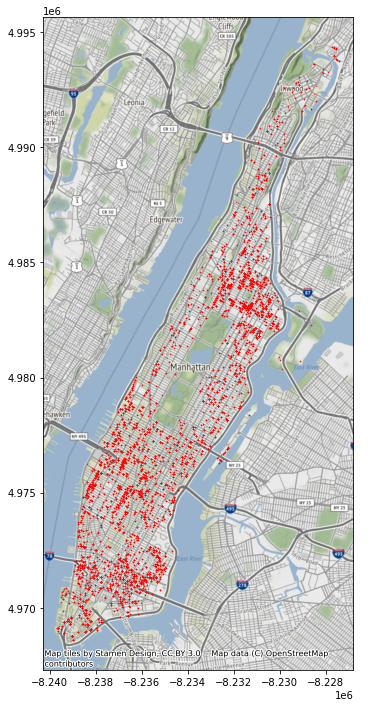

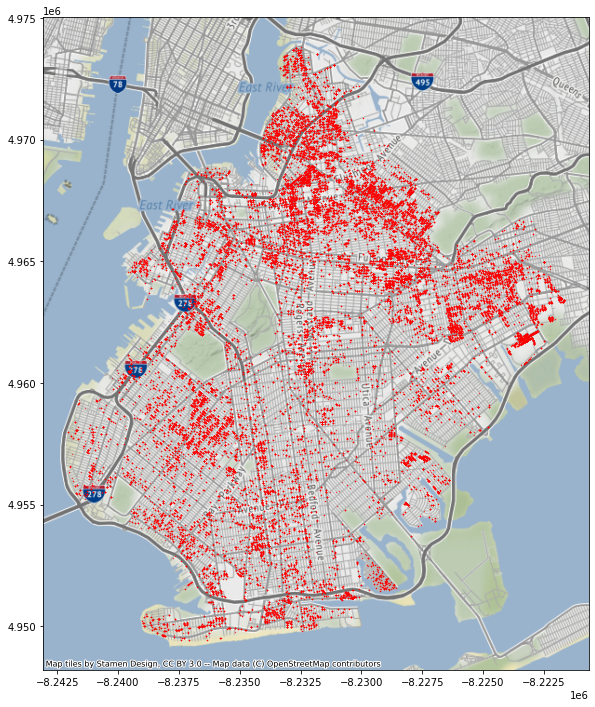

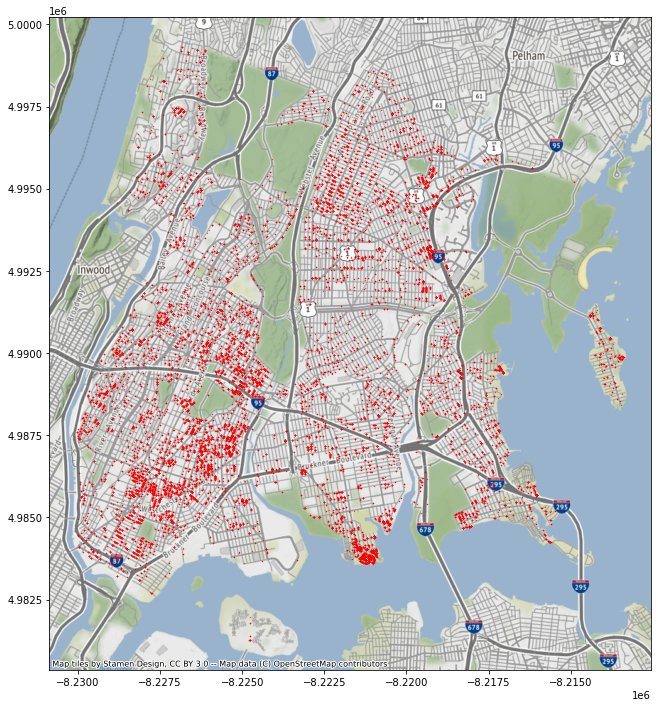

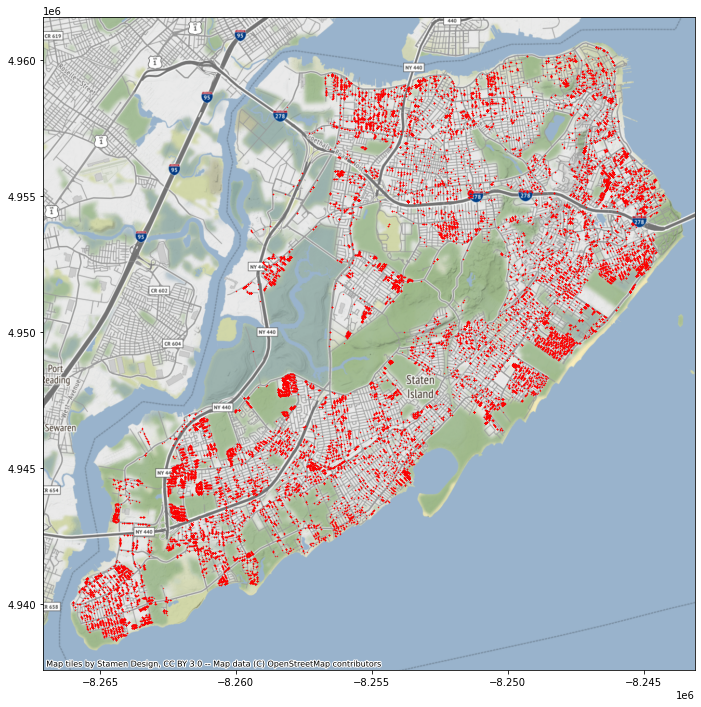

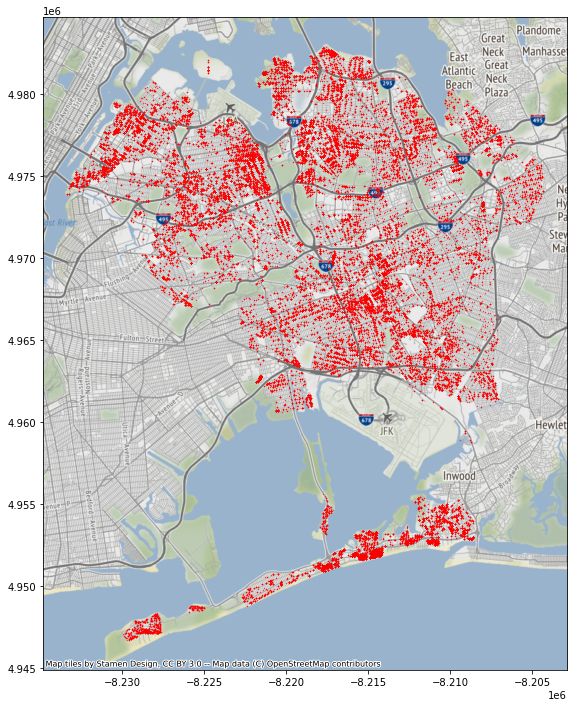

In [20]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    ax=permitsgdf[permitsgdf['borough']==borough].to_crs('EPSG:3857').plot(markersize=.1, color='Red', figsize=(12,12))
    ctx.add_basemap(ax, crs='epsg:3857')

It is somewhat difficult to tell, due to the quantity of points, but it appears that there has been clustering of new buildings throughout NYC in the coastal areas.

## Heatmaps

Next we created heatmaps for the full list of new buildings to further analyze whether there is spatial clustering.

Below is the function for creating static heatmaps, found in the geopandas online resources.

In [21]:
def heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


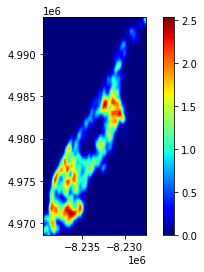

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


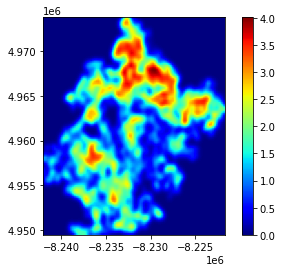

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


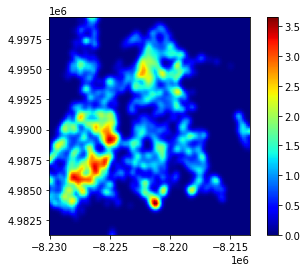

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


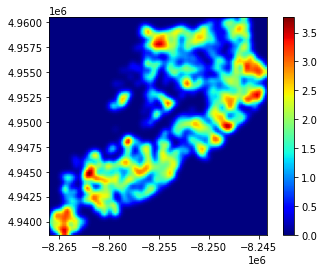

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


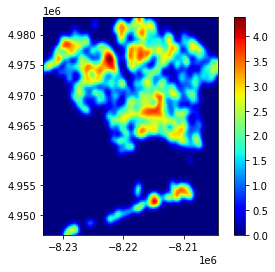

In [22]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    heatmap(permitsgdf[permitsgdf['borough']==borough].to_crs('EPSG:3857'))

While they do not have backgrounds, based on my knowledge of the geography of each borough, it does appear that there have been concentrations of new buildings in coastal areas, particularly on the southern edge of Queens.

I decided to make interactive heatmaps to be able to see the base maps and zoom in and out.

Below is a for loop to generate interactive heatmaps for each borough in folium.  While it does not show the map for each borough after running it, I used it to create html files for each borough that are saved in my repository.  Those can be accessed via the following links: [Manhattan](https://jupyter.idre.ucla.edu/user/jjbasinger@me.com/doc/tree/up206a-jacob/permitheatmapMANHATTAN.html), [Brooklyn](https://jupyter.idre.ucla.edu/user/jjbasinger@me.com/doc/tree/up206a-jacob/permitheatmapBROOKLYN.html), [Bronx](https://jupyter.idre.ucla.edu/user/jjbasinger@me.com/doc/tree/up206a-jacob/permitheatmapBRONX.html), [Staten Island](https://jupyter.idre.ucla.edu/user/jjbasinger@me.com/doc/tree/up206a-jacob/permitheatmapSTATEN%20ISLAND.html), [Queens](https://jupyter.idre.ucla.edu/user/jjbasinger@me.com/doc/tree/up206a-jacob/permitheatmapQUEENS.html).

In [23]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    permits_heat = [[row['gis_latitude'],row['gis_longitude']] for index, row in permitsgdf[permitsgdf['borough']==borough].iterrows()]
    m = folium.Map(location=[40.68, -74.0060], zoom_start=11, tiles='Stamen Terrain')
    HeatMap(permits_heat, name='Permits for New Buildings in' + borough, radius=5, blur=5).add_to(m)
    #I ran the below save line the first time I ran this code successfully in order to generate maps for each borough, saved as html files.
    #m.save('permitheatmap' + borough +'.html')

While these heatmaps aren't great because of the number of permits, everyone likes an interactive map.

For the most part it looks as if the concentrations of building permits for new buildings are random.  However, the coastline in Queens and Staten Island look to have higher concentrations of new building permits.  This is interesting, because these are permits for new buildings in the most vulnerable areas.  It is possible that this is due to the need to rebuild following Hurrican Sandy, however.

### Seaborn and Point Pattern Analysis

First we plotted the point data using seaborn and coloring based on borough -- I think it makes a pretty cool map.

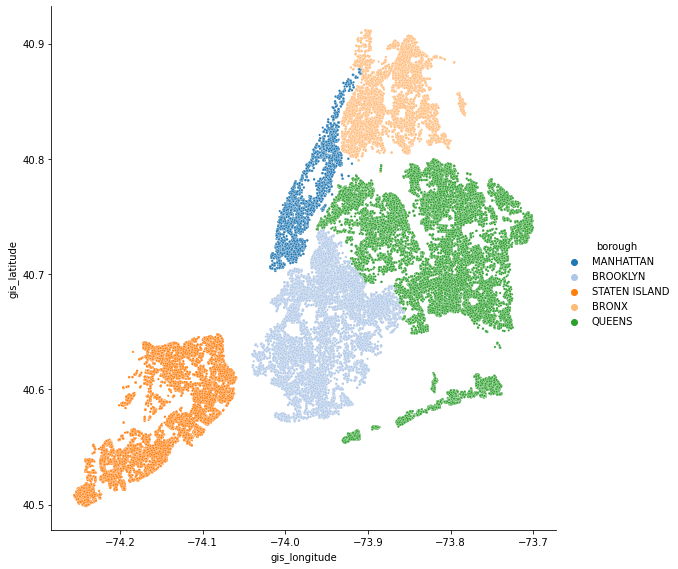

In [24]:
sns.relplot(data=permitsgdf,
            x='gis_longitude', 
            y='gis_latitude',
            hue='borough',
            palette='tab20',
            s=5,
            height=8)

Then we tried out the jointplot, but due to the sheer quantity of points it does not appear to be particularly helpful.

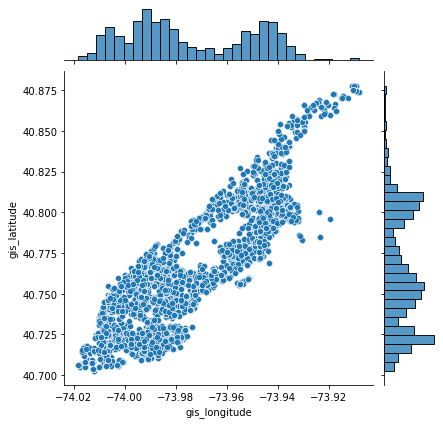

In [25]:
sns.jointplot(data = permitsgdf[permitsgdf['borough']=='MANHATTAN'],
                  x='gis_longitude', 
                  y='gis_latitude')

We then used seaborn to create more heatmaps, this time using the hexbin option.

(-74.28255045060952, -73.67303054939049, 40.477979899999994, 40.9322381)

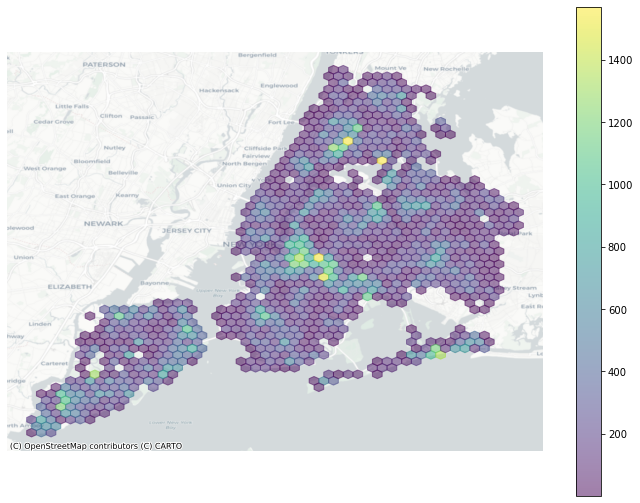

In [26]:
f, ax = plt.subplots(figsize=(12, 9))

hb = ax.hexbin(
    x = permitsgdf['gis_longitude'], 
    y = permitsgdf['gis_latitude'],
    gridsize=50, 
    linewidths=1,
    alpha=0.5, 
    mincnt=1,
    cmap='viridis'
)

ctx.add_basemap(
    ax, 
    crs='epsg:4326',
    source=ctx.providers.CartoDB.Positron
)

plt.colorbar(hb)

ax.axis('off')

In this heatmap you can see the clustering of some new buildings along the coastline in Queens, and along the coastline of Staten Island.

Finally, we performed the point pattern analysis using the mean, median, and ellipse methods demonstrated in class.  I did edit the function slightly to include an option for selecting the data to use, as we plan on using the same function for a filtered dataset later on.

In [27]:
def permits_ellipse(data, borough):
    
    # filter the data by borough
    permits_filtered = data[(data.borough == borough)]

    # mean center and median
    mean_center = centrography.mean_center(permits_filtered[['gis_longitude','gis_latitude']])
    med_center = centrography.euclidean_median(permits_filtered[['gis_longitude','gis_latitude']])

    # standard ellipse
    major, minor, rotation = centrography.ellipse(permits_filtered[['gis_longitude','gis_latitude']])

    # Set up figure and axis
    f, ax = plt.subplots(1, figsize=(9, 9))

    # plot new building points
    ax.scatter(permits_filtered['gis_longitude'], permits_filtered['gis_latitude'], s=3)

    # add the mean and median center points
    ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
    ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

    # Construct the standard ellipse using matplotlib
    ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                      width=major*2, # centrography.ellipse db_filtered
                      height=minor*2, 
                      angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                      facecolor='none', 
                      edgecolor='red', linestyle='--',
                      label='Std. Ellipse')

    ax.add_patch(ellipse)

    # add the legend
    ax.legend()

    # no axis
    ax.axis('Off')

    # add a dynamic title
    ax.set_title(borough + ': ' + str(len(permits_filtered)) + ' building permits for new buildings')

    # add a basemap
    ctx.add_basemap(ax,
                    crs='epsg:4326',
                    source=ctx.providers.CartoDB.Positron)
    # Display
    plt.show()

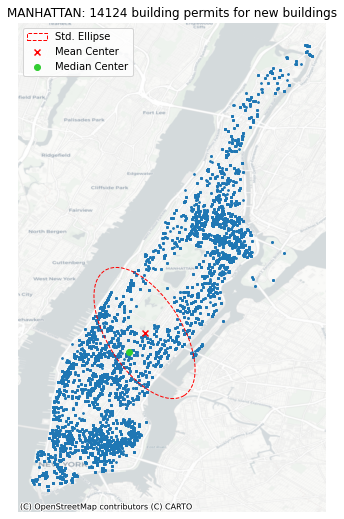

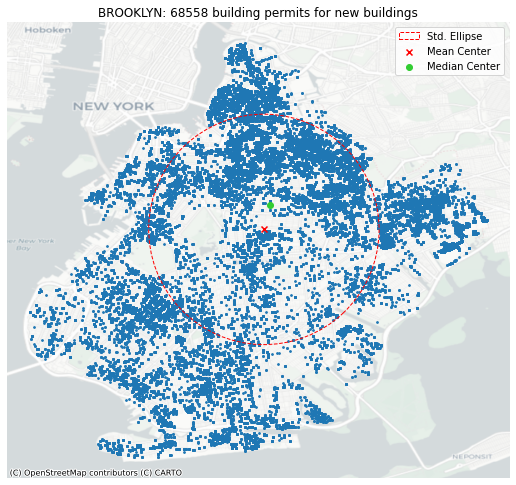

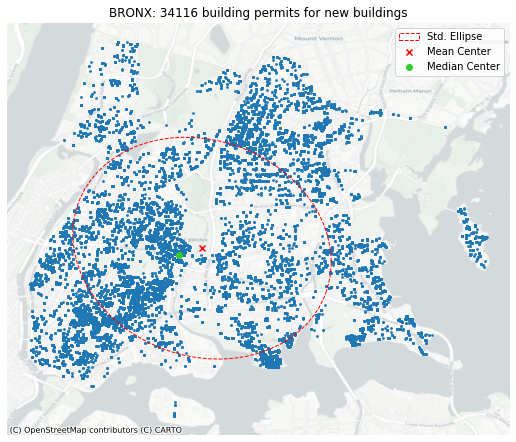

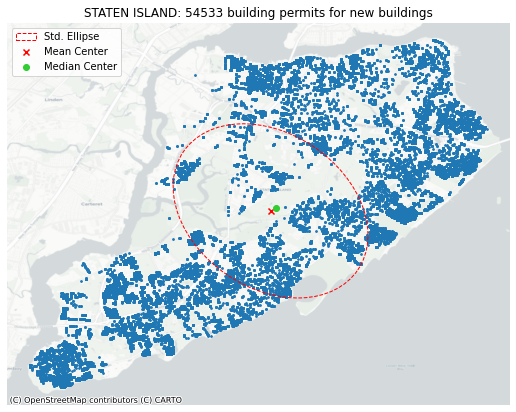

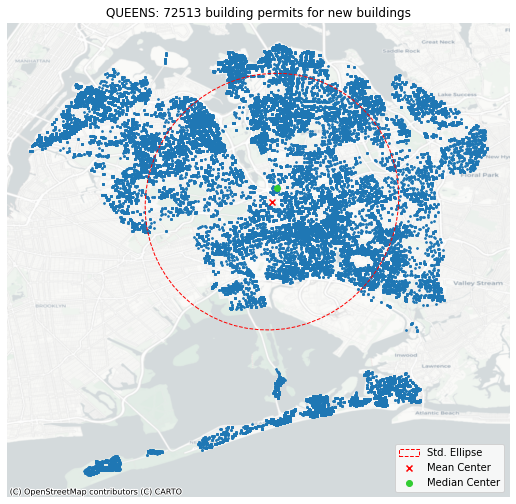

In [28]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    permits_ellipse(permitsgdf, borough)

This analysis shows that there are not many distributional discrepancies in each borough.  The means and medians are fairly close together in each borough, and the ellipses that are oblong are likely due to the strange shapes of the boroughs themselves, not any statistically significant distributions of the data.

## Sorting for new buildings commenced after a certain date

We then decided to perform the same analyses, but on data that has been filtered to only include those new buildings that were initiated **after** Hurricane Sandy.  This may be able to show a relationship between the real estate market and sea level rise because investors may be more hesitant to build in locations that were flooded during Sandy.  However, it is possible that we may see the opposite trend due to the need to rebuild in those locations.  The description of the data that was provided by NYC does indicate that the "new building" option cannot be selected if any part of the former structure is to remain, so theoretically this dataset should only include completely new builds, not reconstructions on existing foundations following a flood.

In [29]:
permitsgdf.job_start_date.value_counts()

2004-05-24    412
2004-06-09    401
2004-12-23    372
2008-06-27    358
2008-06-24    317
             ... 
03/16/2007      1
2020-05-21      1
2020-05-24      1
2020-05-26      1
2011-02-09      1
Name: job_start_date, Length: 9403, dtype: int64

Uh oh, it looks like not all of the dates are in the same format. I used the pandas datetime function to convert the column into the datetime format.

In [30]:
import datetime

In [31]:
permitsgdf['job_start_date'] = pd.to_datetime(permitsgdf['job_start_date'])

In [32]:
permitsgdf['job_start_date'].head()

0   2015-10-08
1   2018-12-07
3   2019-06-24
4   2019-06-24
5   2018-11-01
Name: job_start_date, dtype: datetime64[ns]

We can now sort by 'job_start_date', as that is the year when the initial permit was issued for the new building job. We can look at that date to see when the decision to build the new building was made, and see if there is any correlation with flooding or sea level rise risk.

In [33]:
permitsgdf.sort_values('job_start_date')

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,work_type,geometry
24898,QUEENS,2096863,NB,02605,2,ISSUED,RENEWAL,NB,1990-03-08,1990-03-08,1991-02-01,1989-06-29,40.793694,-73.884157,1,Rikers Island,NaN,POINT (-73.88416 40.79369)
203689,QUEENS,2096863,NB,02605,2,ISSUED,INITIAL,NB,1989-06-29,1989-06-29,1990-02-01,1989-06-29,40.793694,-73.884157,1,Rikers Island,NaN,POINT (-73.88416 40.79369)
183895,QUEENS,2097042,NB,02605,2,ISSUED,INITIAL,NB,1989-07-13,1989-07-13,1990-04-01,1989-07-13,40.789862,-73.884398,1,Rikers Island,NaN,POINT (-73.88440 40.78986)
213914,QUEENS,2097042,NB,02605,2,RE-ISSUED,INITIAL,NB,1989-07-13,1989-07-13,1990-04-01,1989-07-17,40.789862,-73.884398,1,Rikers Island,NaN,POINT (-73.88440 40.78986)
127780,QUEENS,4160334,NB,07448,2,ISSUED,INITIAL,NB,1989-07-19,1989-07-19,1990-03-20,1989-07-19,40.751750,-73.760381,1399,Bayside-Bayside Hills,NaN,POINT (-73.76038 40.75175)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6599,MANHATTAN,1083411,NB,00284,2,ISSUED,RENEWAL,NB,2016-03-04,2016-03-08,2017-02-23,NaT,40.714143,-73.989128,6,Lower East Side,NaN,POINT (-73.98913 40.71414)
14554,MANHATTAN,1083411,NB,00284,2,ISSUED,RENEWAL,NB,2017-03-28,2017-03-28,2018-02-23,NaT,40.714143,-73.989128,6,Lower East Side,NaN,POINT (-73.98913 40.71414)
126716,MANHATTAN,1083411,NB,00284,2,ISSUED,RENEWAL,NB,2015-03-05,2015-03-05,2016-02-23,NaT,40.714143,-73.989128,6,Lower East Side,NaN,POINT (-73.98913 40.71414)
155731,MANHATTAN,1083411,NB,00284,2,RE-ISSUED,RENEWAL,NB,2015-02-10,2015-02-10,2015-02-26,NaT,40.714143,-73.989128,6,Lower East Side,NaN,POINT (-73.98913 40.71414)


Cutting down the dataset to only contain those new buildings that were commenced between the end of Hurricane Sandy, November 2, 2012, and 2030, which appears to be the most realistic projected start date for the upper end of the dataset (there are start dates of 2099 and up that I have decided to exclude).

In [34]:
post_sandy_permitsgdf = permitsgdf[(permitsgdf['job_start_date']>'2012-11-02') & 
(permitsgdf['job_start_date']<'2030-12-31')]

In [35]:
post_sandy_permitsgdf.sort_values('job_start_date')

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,work_type,geometry
155265,STATEN ISLAND,5012590,NB,00467,2,ISSUED,RENEWAL,NB,2012-11-08,2012-11-08,2013-08-01,2012-11-07,40.616129,-74.138591,18901,Westerleigh,NaN,POINT (-74.13859 40.61613)
102076,BRONX,2127343,NB,03436,1,ISSUED,INITIAL,NB,2012-11-07,2012-11-07,2013-07-01,2012-11-07,40.807217,-73.850792,4,Soundview-Castle Hill-Clason Point-Harding Park,NaN,POINT (-73.85079 40.80722)
132504,STATEN ISLAND,5158962,NB,06333,1,ISSUED,INITIAL,NB,2012-11-07,2012-11-07,2013-03-10,2012-11-07,40.536935,-74.192536,17009,Arden Heights,NaN,POINT (-74.19254 40.53693)
174526,BRONX,2127341,NB,03436,1,ISSUED,RENEWAL,NB,2014-06-20,2014-06-20,2015-06-20,2012-11-07,40.807264,-73.850886,4,Soundview-Castle Hill-Clason Point-Harding Park,NaN,POINT (-73.85089 40.80726)
22277,BRONX,2127339,NB,03436,1,ISSUED,RENEWAL,NB,2015-06-18,2015-06-18,2016-06-17,2012-11-07,40.807258,-73.851084,4,Soundview-Castle Hill-Clason Point-Harding Park,NaN,POINT (-73.85108 40.80726)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3062,BRONX,2816717,NB,02752,2,ISSUED,INITIAL,NB,08/12/2020,08/12/2020,01/25/2021,2025-08-12,40.827879,-73.889965,12101,Morrisania-Melrose,NaN,POINT (-73.88997 40.82788)
226040,BROOKLYN,3421407,NB,03143,2,ISSUED,RENEWAL,NB,2018-09-04,2018-09-04,2019-09-04,2027-08-22,40.702198,-73.933729,425,Bushwick South,NaN,POINT (-73.93373 40.70220)
110543,BROOKLYN,3421407,NB,03143,2,ISSUED,INITIAL,NB,2017-08-22,2017-08-22,2018-08-22,2027-08-22,40.702198,-73.933729,425,Bushwick South,NaN,POINT (-73.93373 40.70220)
103245,BROOKLYN,3388038,NB,01708,1,ISSUED,INITIAL,NB,2003-01-17,2003-01-17,2003-11-15,2030-01-17,40.678436,-73.927880,299,Crown Heights North,NaN,POINT (-73.92788 40.67844)


In [36]:
post_sandy_permitsgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 53915 entries, 0 to 246437
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   borough           53915 non-null  object        
 1   bin__             53915 non-null  object        
 2   job_type          53915 non-null  object        
 3   block             53915 non-null  object        
 4   bldg_type         53915 non-null  object        
 5   permit_status     53859 non-null  object        
 6   filing_status     53915 non-null  object        
 7   permit_type       53915 non-null  object        
 8   filing_date       53915 non-null  object        
 9   issuance_date     53645 non-null  object        
 10  expiration_date   53711 non-null  object        
 11  job_start_date    53915 non-null  datetime64[ns]
 12  gis_latitude      53915 non-null  float64       
 13  gis_longitude     53915 non-null  float64       
 14  gis_census_tr

After sorting for only those new buildings that were first permitted after Hurricane Sandy, we are left with only 53,915 entries.  It will be interesting to see where these buildings are located, and to see if there is any correlation with damage from Hurricane Sandy or projected sea level rise.

### Raw Maps

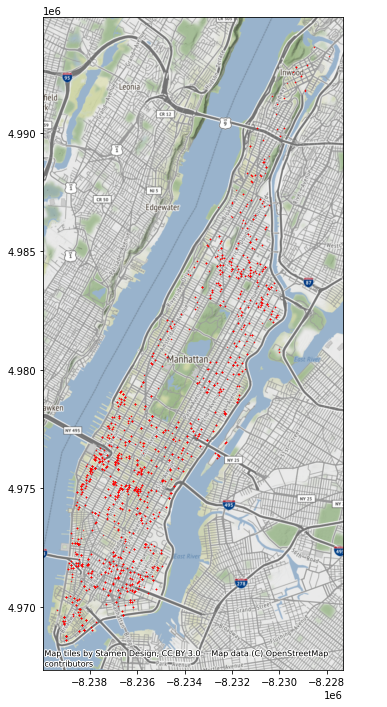

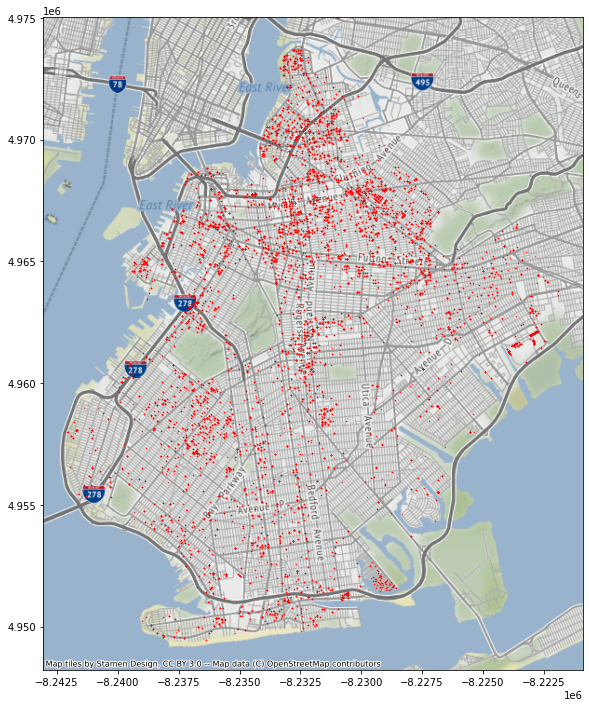

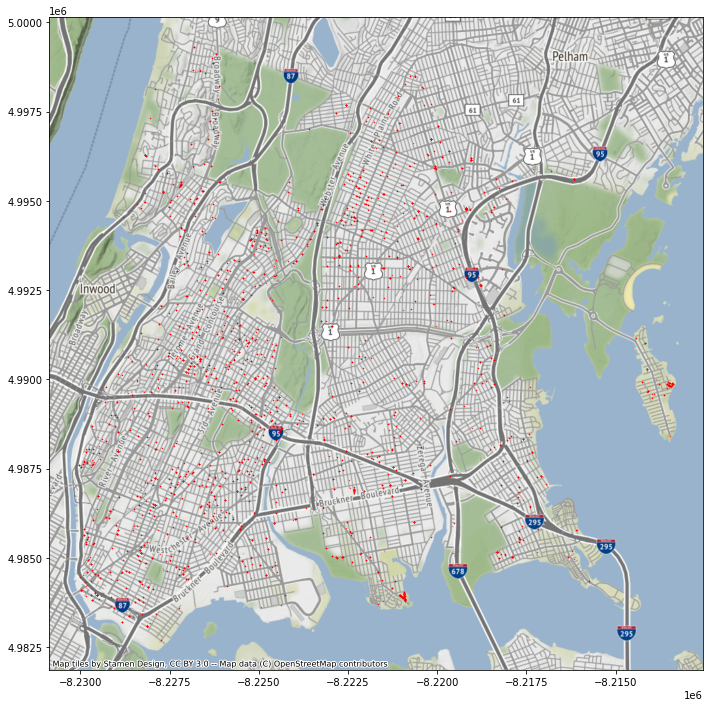

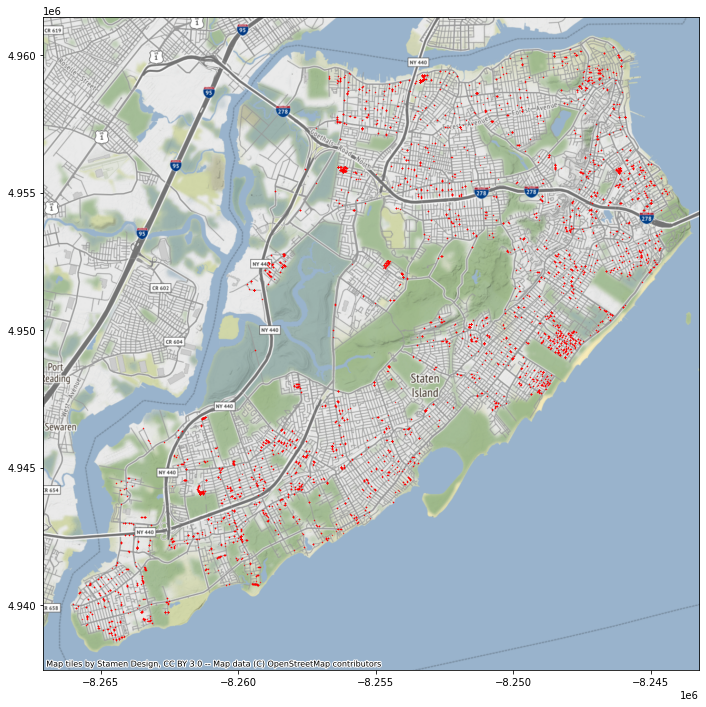

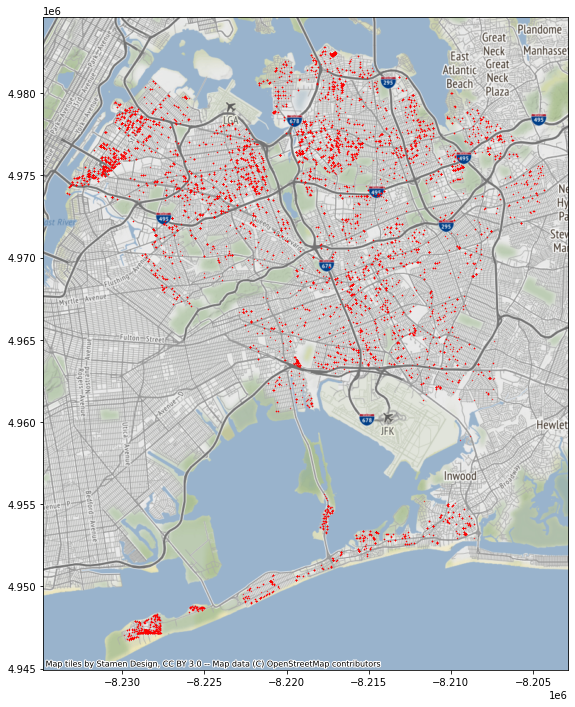

In [37]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    ax=post_sandy_permitsgdf[post_sandy_permitsgdf['borough']==borough].to_crs('EPSG:3857').plot(markersize=.1, color='Red', figsize=(12,12))
    ctx.add_basemap(ax, crs='epsg:3857')

Once again, with the exception of the coastal part of Queens and the edge of Staten Island, it does not look like there is a massive clustering in coastal areas or complete deficiency in coastal areas.

### Heatmaps

Next we plotted static heatmaps using the same methods as above.

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


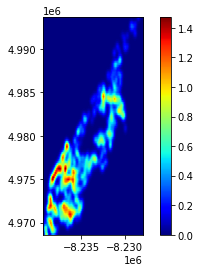

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


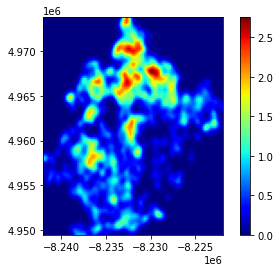

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


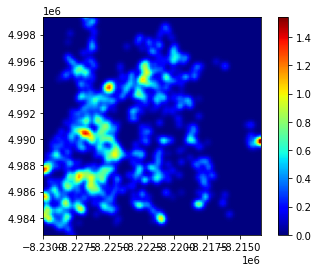

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


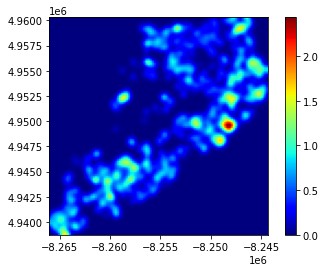

/tmp/ipykernel_6456/3318743415.py:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


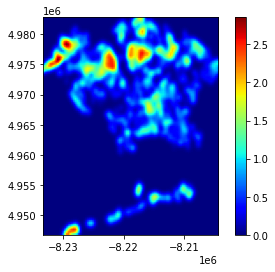

In [38]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    heatmap(post_sandy_permitsgdf[post_sandy_permitsgdf['borough']==borough].to_crs('EPSG:3857'))

On the heatmaps, it looks as if there might be some spatial clustering in the coastal areas.  We will further explore by looking at the seaborn plots.

### Seaborn and Point Pattern Analysis

Finally, we performed the point pattern analysis using seaborn.

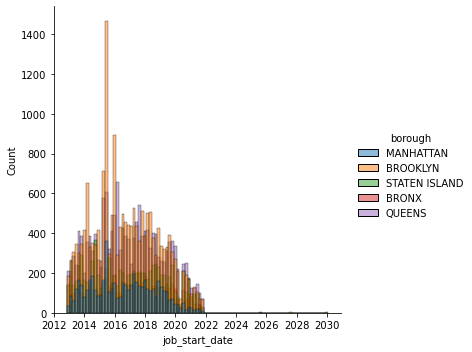

In [39]:
sns.displot(post_sandy_permitsgdf, x='job_start_date', hue='borough')

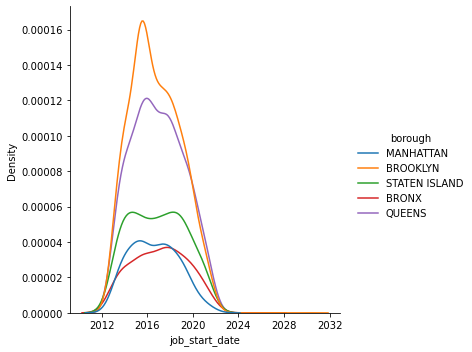

In [40]:
sns.displot(post_sandy_permitsgdf, x='job_start_date', hue='borough', kind='kde', bw_adjust=2)

As shown by the graphs above, Brooklyn and Queens are experiencing much more new building construction (since 2012).  The Queens investments are interesting because many of them are in coastal areas, as shown below.  Perhaps the decisions to construct in Queens have not been influenced by sea level rise and flooding.

Below is the seaborn plot of all building permits for new buildings started since Sandy.

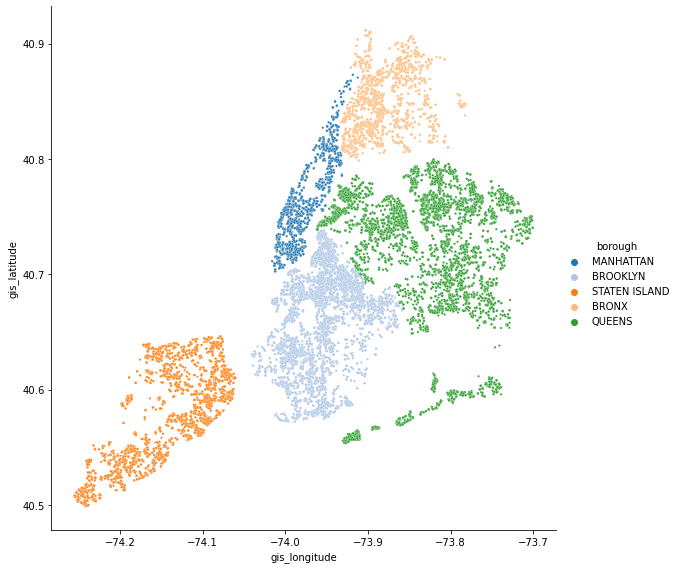

In [41]:
sns.relplot(data=post_sandy_permitsgdf,
            x='gis_longitude', 
            y='gis_latitude',
            hue='borough',
            palette='tab20',
            s=5,
            height=8)

Because there are fewer data points in this filtered dataframe, we decided to run the jointplot command on all boroughs, adding in the mean and median.

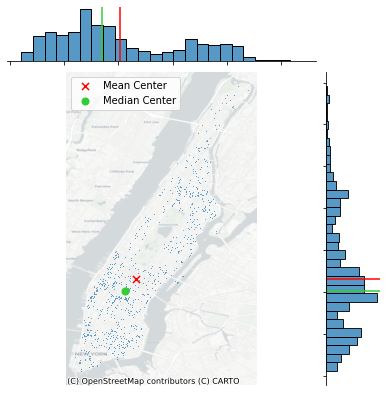

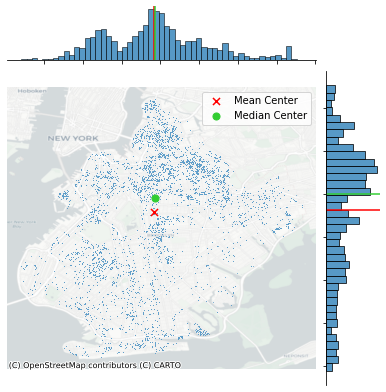

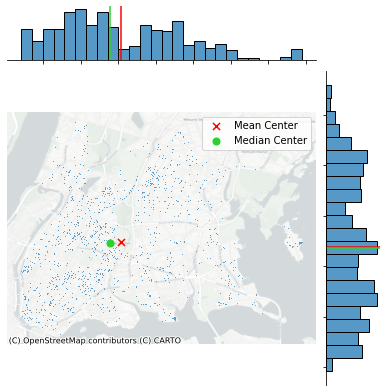

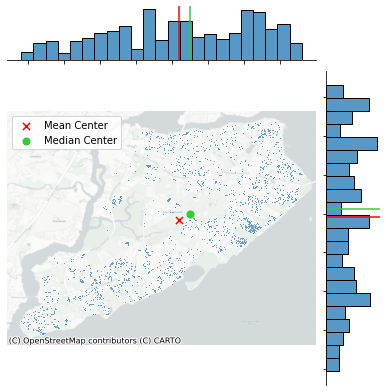

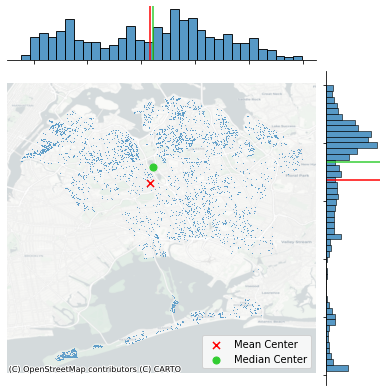

In [42]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    mean_center = centrography.mean_center(post_sandy_permitsgdf[post_sandy_permitsgdf['borough']==borough][['gis_longitude','gis_latitude']])
    med_center = centrography.euclidean_median(post_sandy_permitsgdf[post_sandy_permitsgdf['borough']==borough][['gis_longitude','gis_latitude']])
    
    j=sns.jointplot(data = post_sandy_permitsgdf[post_sandy_permitsgdf['borough']==borough],
                  x='gis_longitude', 
                  y='gis_latitude', s=.85)

# Add mean point and marginal lines
# *mean_center is shortcut for x=mean_center[0],y=mean_center[1]
    j.ax_joint.scatter(
        *mean_center, color='red', marker='x', s=50, label='Mean Center'
    )
    j.ax_marg_x.axvline(mean_center[0], color='red')
    j.ax_marg_y.axhline(mean_center[1], color='red')

# Add median point and marginal lines
    j.ax_joint.scatter(
        *med_center, color='limegreen', marker='o', s=50, label='Median Center'
    )
    j.ax_marg_x.axvline(med_center[0], color='limegreen')
    j.ax_marg_y.axhline(med_center[1], color='limegreen')

# Legend
    j.ax_joint.legend()

# Add basemap
    ctx.add_basemap(
        j.ax_joint, 
        crs='epsg:4326',
        source=ctx.providers.CartoDB.Positron
    )

# Clean axes
    j.ax_joint.set_axis_off()

# Display
    plt.show()


Looking at these jointplots with the mean and median centers on top and the histograms on the edges, it looks like the buildings are being located away from the coastal/vulnerable areas.  Perhaps there has been an internalization of the risks of sea level rise.  The buildings on the southern part of the final map, however, are in a very vulnerable location.  It may be worth looking into what is down there.

Next we created a hexbin heatmap of this same post-Sandy data.

(-74.28254865060947,
 -73.67306834939053,
 40.478403050000004,
 40.932217949999995)

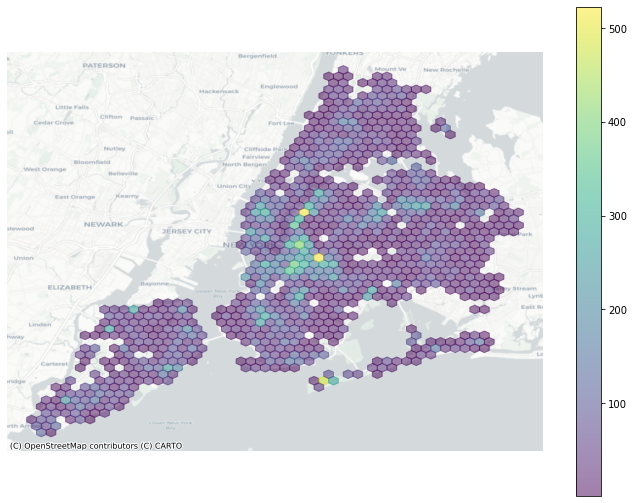

In [43]:
f, ax = plt.subplots(figsize=(12, 9))

hb = ax.hexbin(
    x = post_sandy_permitsgdf['gis_longitude'], 
    y = post_sandy_permitsgdf['gis_latitude'],
    gridsize=50, 
    linewidths=1,
    alpha=0.5, 
    mincnt=1,
    cmap='viridis'
)

ctx.add_basemap(
    ax, 
    crs='epsg:4326',
    source=ctx.providers.CartoDB.Positron
)

plt.colorbar(hb)

ax.axis('off')

This shows that the clustering, apart from on the coast of Queens, is largely in the inland locations.

Finally, we performed the point pattern analysis using centrography via the function defined above, just with the filtered dataset.

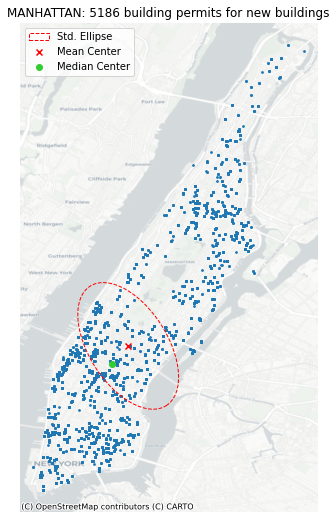

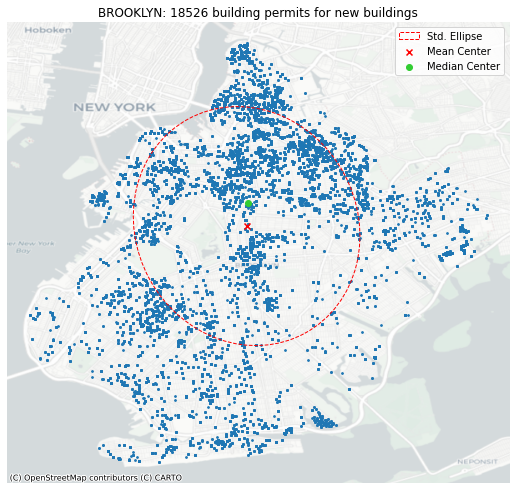

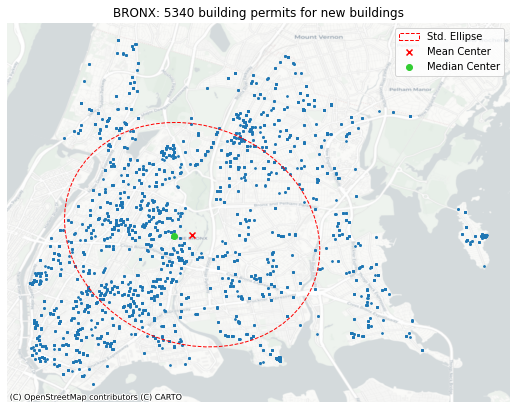

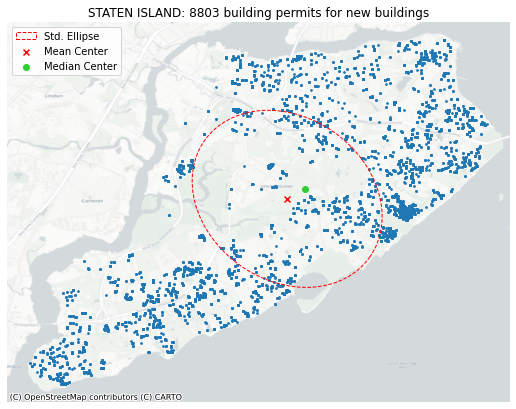

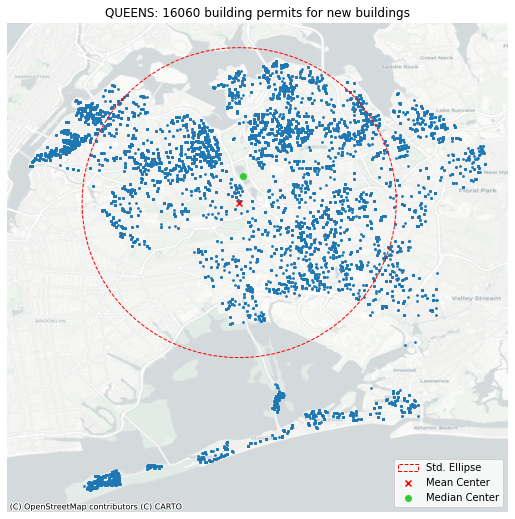

In [44]:
for borough in ['MANHATTAN', 'BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS']:
    permits_ellipse(post_sandy_permitsgdf, borough)

Once again, as shown above, it appears that there is not much significant distribution of building permits within the boroughs of New York City.  While there are clusters of new buildings along the coastline, specifically in Staten Island and Queens, the data is not significantly skewed toward those areas.  In fact, the median centers show that the majority of the new buildings are not being constructed in those more vulnerable locations.

## Conclusion

After looking at the distribution of new buildings in New York City, and specifically at those new buildings commenced after Hurricane Sandy, it appears that flooding and sea level rise have not been  significantly impacting decisions to build new buildings.  While in the boroughs the median centers reflect construction away from the vulnerable coastline (except for in Staten Island and Manhattan), the point pattern analyses and visualization of the locations of the new buildings show that there is still plenty of investment in the coastal areas of the city.

Going forward, we would like to perform further spatial statistical analysis on this data, and plan to add spatial autocorrelation to our research.  We will also map these new building points with the projected flooding/Hurrican Sandy layer in order to better illustrate which of these buildings is in a risky location.

Perhaps it is possible to perform the spatial autocorrelation for points contained in the flood area presented against points that are not in the area -- this is something we will further explore.

*Division of Labor:*
- Jacob - this notebook
- Lucia - notebook on Hurricane Sandy and race